# Evaluating the performance of trading strategies

This is the third part of a series of articles on backtesting trading strategies in Python. The previous ones described the following topics:
* introducing the `zipline` framework and presenting how to test basic strategies (link)
* importing custom data to use with `zipline` (link)

This time, the goal of the article is to show how to quickly and efficiently evaluate the performance of our strategies using a library called `pyfolio` (developed by Quantopian, the creators of `zipline`). `pyfolio` can be used as a standalone library and provide performance results based only on a provided series of returns. However, it works efficiently with `zipline` and I present this combination in this article.

## Importing Libraries

I start by loading the required libraries.

In [1]:
%load_ext watermark

In [2]:
%load_ext zipline

In [3]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import zipline
import warnings
import pyfolio as pf

plt.style.use('seaborn')
plt.rcParams['figure.figsize'] = [16, 9]
plt.rcParams['figure.dpi'] = 200
warnings.simplefilter(action='ignore', category=FutureWarning)

Below you can see the list of libraries used in this article, together with their versions.

In [5]:
%watermark --iversions

zipline    1.3.0
pandas     0.22.0
json       2.0.9
matplotlib 3.0.0
numpy      1.14.6
pyfolio    0.9.2



## Simple Moving Average Strategy

In this article, I only show a basic strategy, as the main focus is on evaluating the performance. For that purpose, I chose a strategy based on the simple moving average (SMA). The logic of the strategy can be summarized by the following:

* when the price crosses the 20-day SMA upwards - buy x shares
* when the price crosses the 20-day SMA downwards - sell the shares
* we can only have a maximum of x shares at any given time
* there is no short-selling in the strategy

I run a backtest of the strategy using IBM's stock over the years 2016-2017. For details on how to create such a strategy and what do the particular components actually do, please refer to my previous article (link).

In [6]:
%%zipline --start 2016-1-1 --end 2017-12-31 --capital-base 10000.0 -o simple_moving_average.pkl

# imports 
from zipline.api import record, symbol, order_target
from zipline.finance import commission

# parameters 
MA_PERIODS = 20
SELECTED_STOCK = 'IBM'
N_STOCKS_TO_BUY = 20

def initialize(context):
    context.time = 0
    context.asset = symbol(SELECTED_STOCK)
    context.set_commission(commission.PerShare(cost=0.0, min_trade_cost=0))
    context.has_position = False

def handle_data(context, data):
    context.time += 1
    if context.time < MA_PERIODS:
        return

    price_history = data.history(context.asset, fields="price", bar_count=MA_PERIODS, frequency="1d")
    ma = price_history.mean()
    
    # cross up
    if (price_history[-2] < ma) & (price_history[-1] > ma) & (not context.has_position):
        order_target(context.asset, N_STOCKS_TO_BUY)
        context.has_position = True
    # cross down
    elif (price_history[-2] > ma) & (price_history[-1] < ma) & (context.has_position):
        order_target(context.asset, 0)
        context.has_position = False

    record(price=data.current(context.asset, 'price'),
           moving_average=ma)

/Users/eryklewinson/anaconda3/envs/env_zipline2/lib/python3.5/site-packages/empyrical/stats.py:704: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/Users/eryklewinson/anaconda3/envs/env_zipline2/lib/python3.5/site-packages/empyrical/stats.py:790: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)


,algo_volatility,algorithm_period_return,alpha,benchmark_period_return,benchmark_volatility,beta,capital_used,ending_cash,ending_exposure,ending_value,...,short_exposure,short_value,shorts_count,sortino,starting_cash,starting_exposure,starting_value,trading_days,transactions,treasury_period_return
2016-01-04 21:00:00+00:00,NaN,0.000000,NaN,-0.013979,NaN,NaN,0.0000,10000.0000,0.0,0.0,...,0.0,0.0,0,NaN,10000.0000,0.0,0.0,1,[],0.0
2016-01-05 21:00:00+00:00,0.000000,0.000000,0.000000,-0.012312,0.175905,0.000000,0.0000,10000.0000,0.0,0.0,...,0.0,0.0,0,NaN,10000.0000,0.0,0.0,2,[],0.0
2016-01-06 21:00:00+00:00,0.000000,0.000000,0.000000,-0.024771,0.137796,0.000000,0.0000,10000.0000,0.0,0.0,...,0.0,0.0,0,NaN,10000.0000,0.0,0.0,3,[],0.0
2016-01-07 21:00:00+00:00,0.000000,0.000000,0.000000,-0.048168,0.167837,0.000000,0.0000,10000.0000,0.0,0.0,...,0.0,0.0,0,NaN,10000.0000,0.0,0.0,4,[],0.0
2016-01-08 21:00:00+00:00,0.000000,0.000000,0.000000,-0.058616,0.145620,0.000000,0.0000,10000.0000,0.0,0.0,...,0.0,0.0,0,NaN,10000.0000,0.0,0.0,5,[],0.0
2016-01-11 21:00:00+00:00,0.000000,0.000000,0.000000,-0.057684,0.154994,0.000000,0.0000,10000.0000,0.0,0.0,...,0.0,0.0,0,NaN,10000.0000,0.0,0.0,6,[],0.0
2016-01-12 21:00:00+00:00,0.000000,0.000000,0.000000,-0.050081,0.177568,0.000000,0.0000,10000.0000,0.0,0.0,...,0.0,0.0,0,NaN,10000.0000,0.0,0.0,7,[],0.0
2016-01-13 21:00:00+00:00,0.000000,0.000000,0.000000,-0.073773,0.192027,0.000000,0.0000,10000.0000,0.0,0.0,...,0.0,0.0,0,NaN,10000.0000,0.0,0.0,8,[],0.0
2016-01-14 21:00:00+00:00,0.000000,0.000000,0.000000,-0.058567,0.225892,0.000000,0.0000,10000.0000,0.0,0.0,...,0.0,0.0,0,NaN,10000.0000,0.0,0.0,9,[],0.0
2016-01-15 21:00:00+00:00,0.000000,0.000000,0.000000,-0.078776,0.225682,0.000000,0.0000,10000.0000,0.0,0.0,...,0.0,0.0,0,NaN,10000.0000,0.0,0.0,10,[],0.0


`zipline` automatically creates a performance DataFrame, which you can also see above. For convenience, I stored the output in a pickle file called `simple_moving_average.pkl`. To make the analysis as smooth as possible, we can use a utility function provided by `pyfolio` and load the 3 most important elements of the performance DataFrame - the returns, positions, and transactions. To do so, I use `pf.utils.extract_rets_pos_txn_from_zipline`.

In [7]:
sma_results = pd.read_pickle('simple_moving_average.pkl')
returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(sma_results)

We can now inspect the extracted elements:

In [8]:
returns.head()

2016-01-04 00:00:00+00:00    0.0
2016-01-05 00:00:00+00:00    0.0
2016-01-06 00:00:00+00:00    0.0
2016-01-07 00:00:00+00:00    0.0
2016-01-08 00:00:00+00:00    0.0
Name: returns, dtype: float64

There could be no returns over the first 20 trading days of 2016, as it is still the warm-up period for the moving average.

In [9]:
positions.head()

sid,Equity(1441 [IBM]),cash
index,,
2016-02-05 00:00:00+00:00,2571.4,7427.3143
2016-02-08 00:00:00+00:00,2539.6,7427.3143
2016-02-09 00:00:00+00:00,2481.4,7427.3143
2016-02-17 00:00:00+00:00,2522.0,7306.6514
2016-02-18 00:00:00+00:00,2649.0,7306.6514


The `positions` DataFrame contains entries for each day when we do have a position in the considered assets and shows the capital split between equities and cash. We can see that by buying 20 IBM shares we still keep the majority of the capital in cash. For more advanced strategies, we can allocate a percentage of the capital to each order by using `order_percent`.

In [10]:
transactions.head()

,amount,commission,dt,order_id,price,sid,symbol,txn_dollars
2016-02-05 21:00:00+00:00,20,None,2016-02-05 21:00:00+00:00,263b7475243b4a39a1d5bf551927d56d,128.634285,Equity(1441 [IBM]),Equity(1441 [IBM]),-2572.6857
2016-02-10 21:00:00+00:00,-20,None,2016-02-10 21:00:00+00:00,604d0ba9cec74a6f9c6ae1ee805426df,120.129905,Equity(1441 [IBM]),Equity(1441 [IBM]),2402.5981
2016-02-17 21:00:00+00:00,20,None,2016-02-17 21:00:00+00:00,36fcff870c9b46c495d9dbbf71d9a223,126.163050,Equity(1441 [IBM]),Equity(1441 [IBM]),-2523.2610
2016-04-20 20:00:00+00:00,-20,None,2016-04-20 20:00:00+00:00,68fc366e855c4e8f8cd6c656fd9f1b0c,146.036945,Equity(1441 [IBM]),Equity(1441 [IBM]),2920.7389
2016-04-28 20:00:00+00:00,20,None,2016-04-28 20:00:00+00:00,fdb7484a64a74197ab59f3322e7ba01a,147.143535,Equity(1441 [IBM]),Equity(1441 [IBM]),-2942.8707


The `transactions` DataFrame contains all the transactions executed by the trading strategy - we see both buy and sell orders.

## Creating a simple tear sheet

To evaluate the performance of strategies, portfolios or even single assets, we use `pyfolio` to create a tear sheet. A tear sheet is a concise document (often a single-paged one) that contains the most important information - such as financial metrics - regarding a public company. `pyfolio` provides much more functionalities than can be contained on a single sheet of paper, but for simplicity, we start with a simple tear sheet, which contains only the most vital information.

To create it, we run the following:

Start date,2016-01-04
End date,2017-12-29
Total months,23
,Backtest
Annual return,3.4%
Cumulative returns,6.9%
Annual volatility,4.1%
Sharpe ratio,0.84
Calmar ratio,1.39
Stability,0.82
Max drawdown,-2.4%


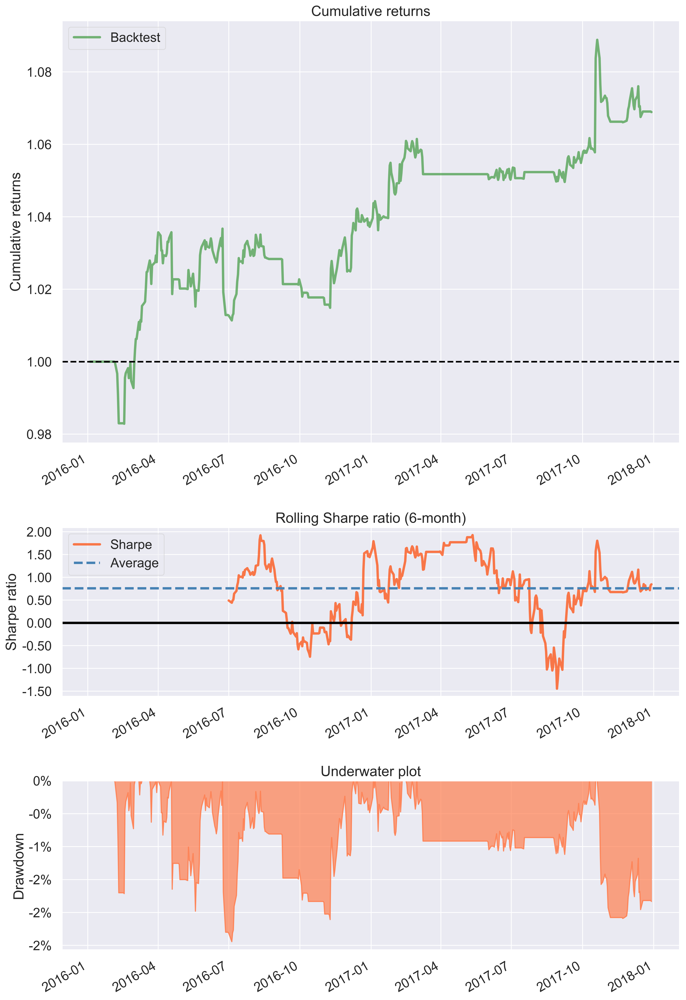

In [11]:
pf.create_simple_tear_sheet(returns)

What is truly remarkable about `pyfolio` is that it generates so much information with a single line of code!

The first table we see presents the dates of the test, how many months it lasted and a lot of financial metrics such as:
* annualized returns/standard deviation
* skewness - the third moment describes how skewed is the distribution
* kurtosis -  the fourth moment indicates if there is more mass in the tails of the distribution
* Sharpe ratio - a very popular risk metric. It indicates the amount of excess return (over the risk-free rate) per unit of risk (measured by standard deviation).
* Sortino ratio - a modified version of the Sharpe ratio, where the standard deviation is replaced by downside deviation. Downside deviation measures only the negative volatility of the series, strictly speaking below a predefined level called minimum acceptable return.
* Omega ratio - another kind of risk-return performance metric. Its biggest advantage over the Sharpe ratio is that - by construction - it takes into account all statistical moments, while the Sharpe ratio only considers the first two.
* Maximum drawdown - indicates the largest (expressed in %) drop between a peak and a valley
* daily Value-at-Risk - another very popular risk metric. In this case, it indicates that in 95% of the cases, we will not lose more than 0.5% by keeping the position/portfolio for 1 more day.

The first 3 bullets are connected to the stylized facts of asset returns, which I described in one of the previous articles.

The next chart present the cumulative returns on our strategy - we can observe the evolution of our portfolio's worth over the two years of running this strategy. The flat periods represent periods when we held no assets.

We can also see the rolling Sharpe ratio, which provides more insight into the stability of our strategy. We see that the overall reported Sharpe ratio is 0.84, however, when we look at the rolling one we see how volatile it was over time (calculated using rolling 6 months of data, not entire sample!).

The last chart - the underwater plot - shows the investment from a pessimistic point of view. By pessimistic, I mean that it focuses on losses. It depicts drawdowns and shows how long it took for the portfolio's value to recover to the previous peak, after suffering a loss. This chart makes it easy to distinguish between normal and extended periods of losses.

We created all these plots by passing only the `returns` object to the function. We can also pass the previously extracted positions and transactions, to automatically receive even more information on the simple tear sheet! Additionally, we can also specify a `live_start_date`, which splits the periods into the backtest and live-trading ones (`zipline` offers such a possibility). To do so, we simply run:

In [12]:
pf.create_simple_tear_sheet(returns, positions, transactions, live_start_date='2017-01-01')

In the table above we immediately see the changes:

* there are two separate periods for analysis
* providing positions and transactions related data resulted in extra metrics such as gross leverage and extra turnover

The simple tear sheet also contains more plots related to positions and transactions, however, I do not show them for brevity.

## Creating a full Tear Sheet

In the previous part, we only created a simple tear sheet, which gave a concise overview of the strategy's performance. It is possible to easily obtain much more information, by creating a full tear sheet (it's level of detail also depends on the provided information - here we only use returns).

Start date,2016-01-04
End date,2017-12-29
Total months,23
,Backtest
Annual return,3.4%
Cumulative returns,6.9%
Annual volatility,4.1%
Sharpe ratio,0.84
Calmar ratio,1.39
Stability,0.82
Max drawdown,-2.4%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,2.44,2016-06-23,2016-07-05,2016-12-09,122
1,2.09,2017-10-20,2017-11-22,NaT,NaN
2,1.98,2016-04-18,2016-05-19,2016-06-23,49
3,1.71,2016-02-04,2016-02-17,2016-03-02,20
4,1.12,2017-03-01,2017-09-08,2017-10-10,160


Stress Events,mean,min,max
New Normal,0.01%,-1.69%,2.46%


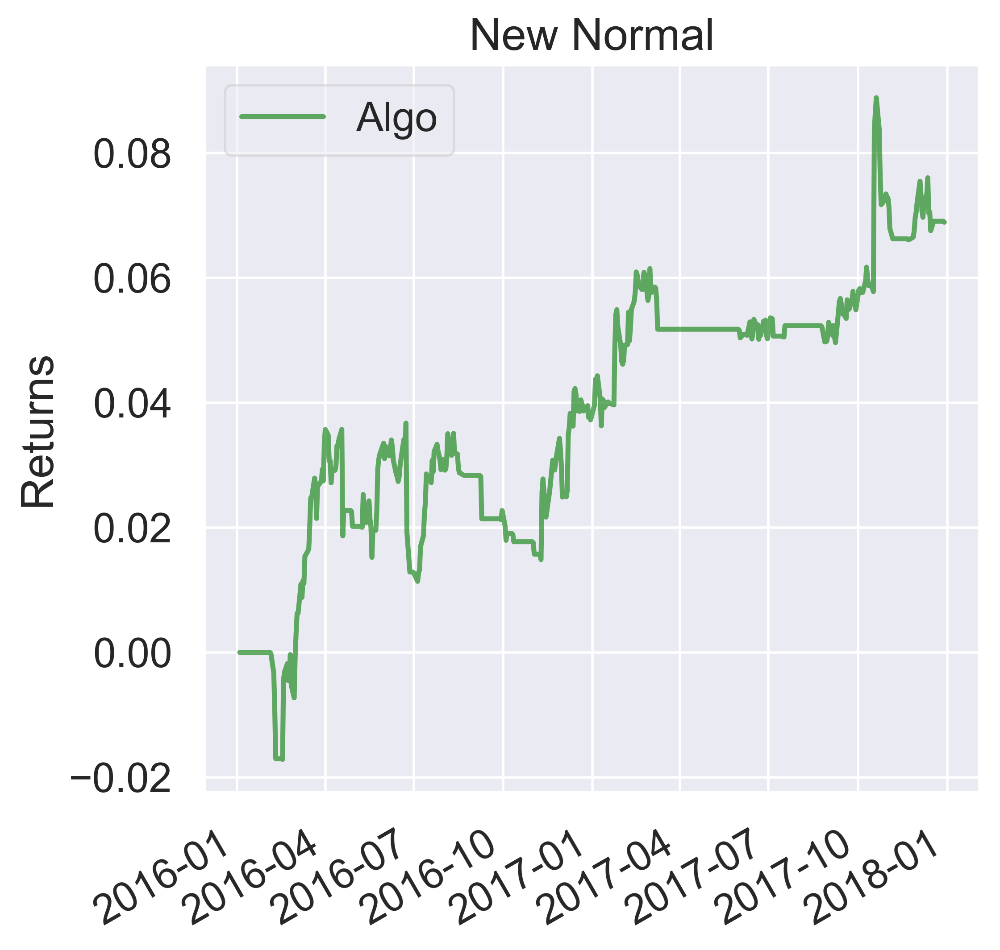

In [13]:
pf.create_full_tear_sheet(returns)

I present a selection of new tables/charts included in the full tear sheet:
* A table presenting top 5 worts drawdowns, together with information such as peak/valley date and the duration
* Top 5 drawdown periods visualized on top of the cumulative returns. In our case, the drawdown periods cover almost the entire investment horizon. One of the reasons is that for extended periods of time we had no open positions, so the cumulative returns did not change, thus extending the recovery time.
* A simple plot showing the daily returns over time. The flat periods reflect the times when we had no position in the underlying asset.
* A selection of plots summarizing the strategy's returns by breaking them down into: monthly returns (separately per each year), annual returns per each year, a histogram presenting the distribution of monthly returns and finally quantiles of returns expressed in different frequencies. 

## Conclusions 

In this article, I showed how to use `pyfolio` to easily obtain a plethora of financial metrics and plots describing the performance of an asset/strategy/portfolio. This post gives a high-level introduction, while there are still many aspects to cover.

Some of the other functionalities of `pyfolio` include:
* plots can be accessed manually without creating a simple/full tear sheet - for example, we can create a "top 5 worst drawdowns plot" by running `pf.plot_drawdown_periods(returns, top=5)`
* we can account for slippage while creating the tear sheets
* create Bayesian tear sheets (based on PyMC3, require separate dependencies installed)

Quantopian also released a library called `empyrical`, which is used to calculate all the risk metrics used in `pyfolio`. One possible advantage of using it is when we are purely interested in calculating one metric, such as the Omega ratio or the Sortino ratio. If that is the case, I certainly recommend `empyrical` for the task.
Kudos to Quantopian for creating such comprehensive libraries as `zipline`, `pyfolio` and `empyrical`!

## References

* https://github.com/quantopian
* https://www.youtube.com/watch?v=BCLgXjxYONg